<a href="https://colab.research.google.com/github/ganesh10-code/DL_Lab/blob/main/Week_8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Week-9

19.Write a program to Visualizing Convolutional Neural Networks(display result of convolution and pooling operations as feature map)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step

input_layer_6 → Other Layer
Shape: (1, 128, 128, 3)


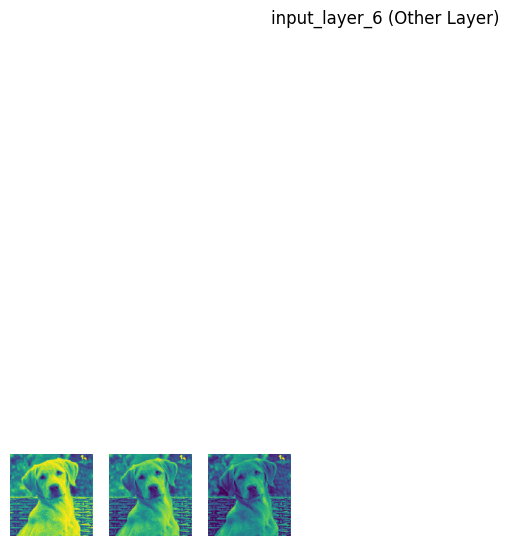


conv2d_12 → Convolution Layer
Shape: (1, 128, 128, 16)


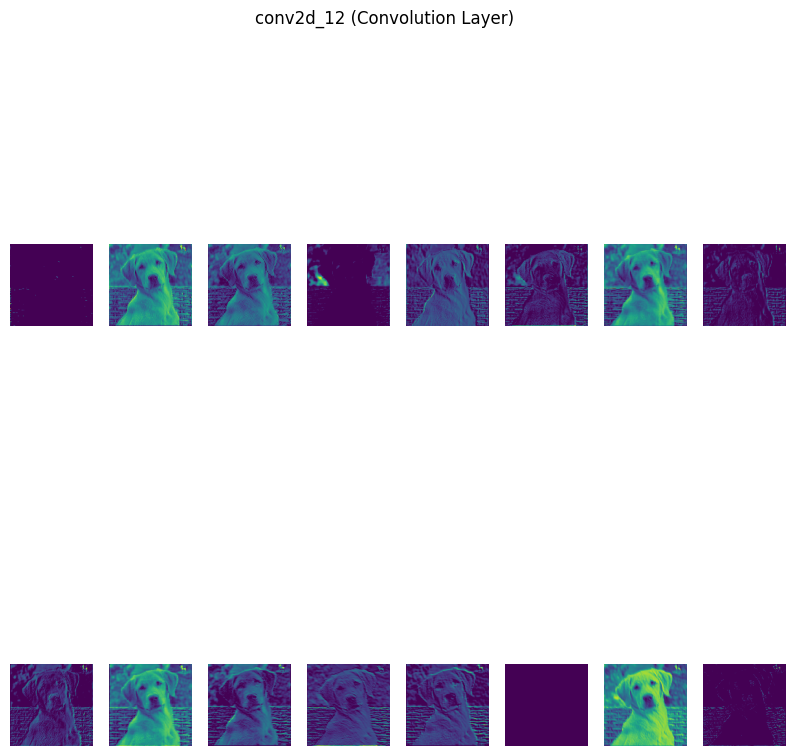


max_pooling2d_9 → Pooling Layer
Shape: (1, 64, 64, 16)


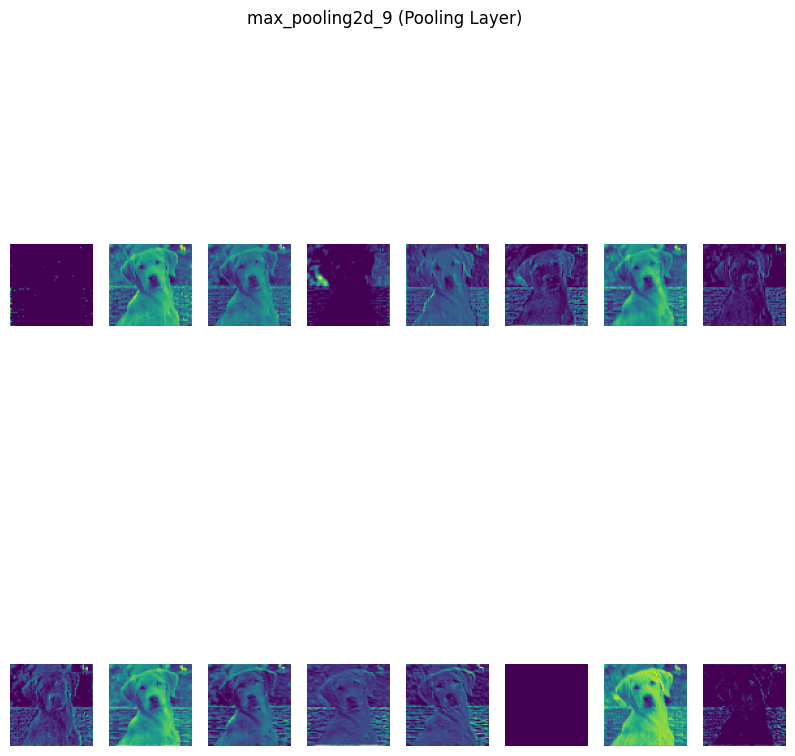


conv2d_13 → Convolution Layer
Shape: (1, 64, 64, 32)


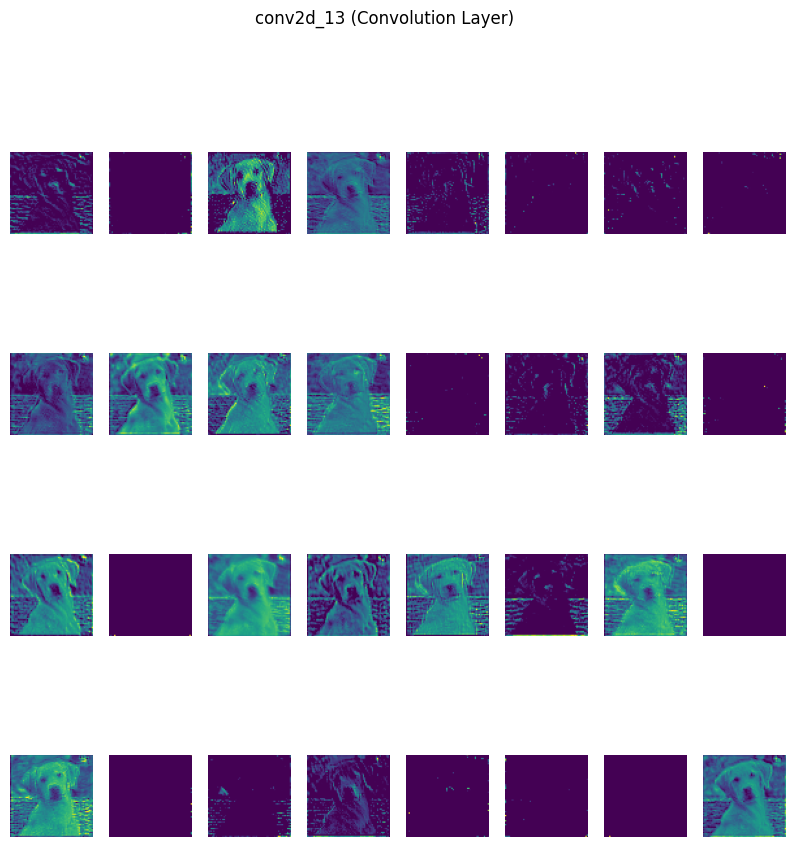


max_pooling2d_10 → Pooling Layer
Shape: (1, 32, 32, 32)


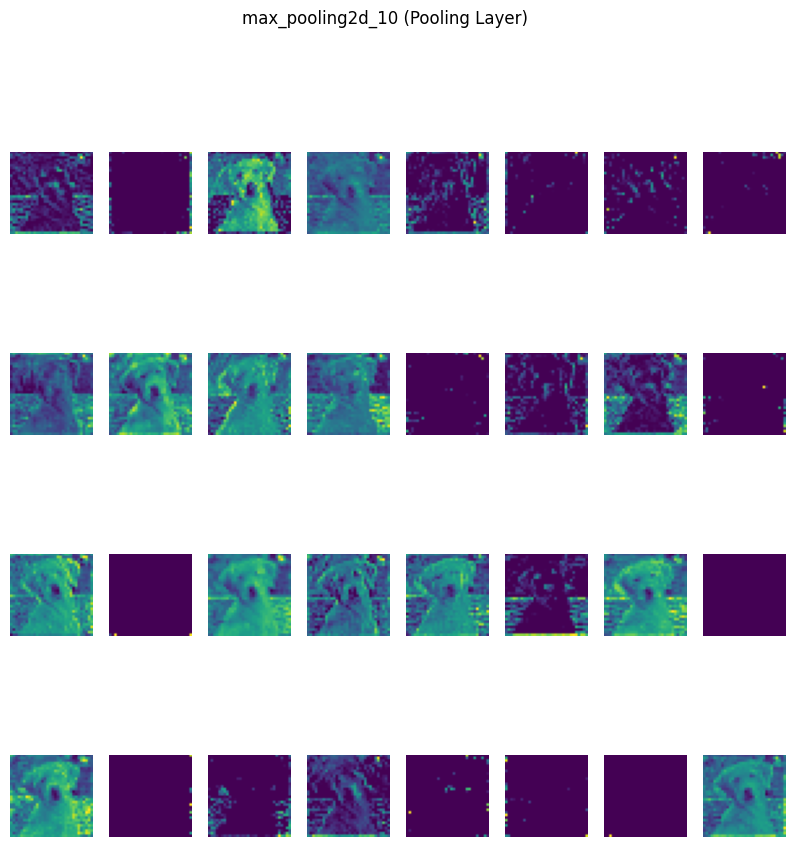


conv2d_14 → Convolution Layer
Shape: (1, 32, 32, 64)


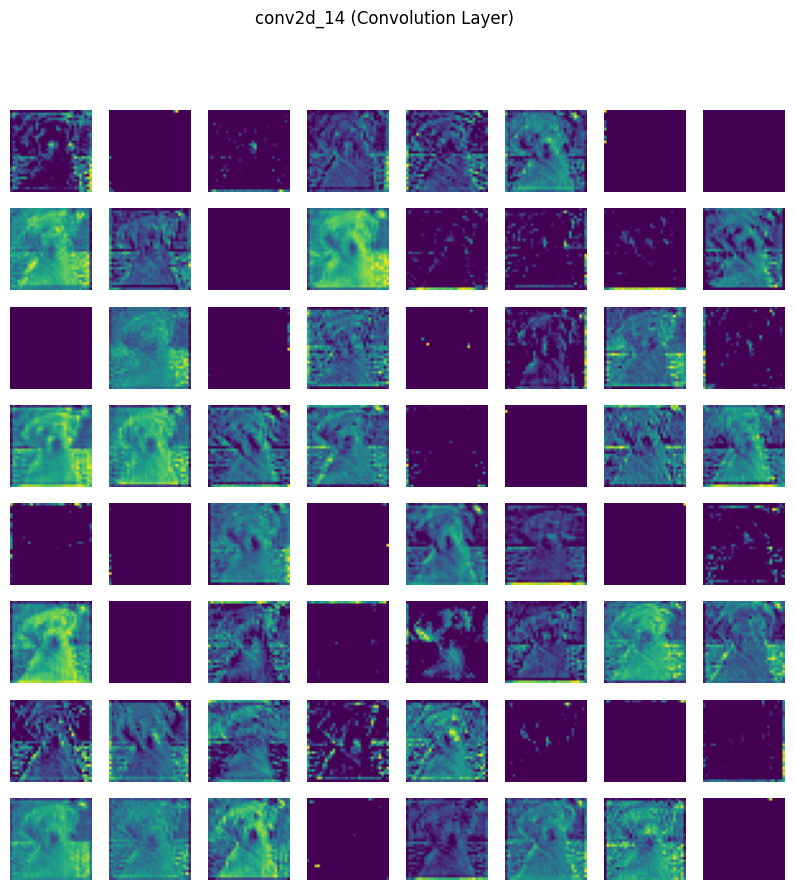


max_pooling2d_11 → Pooling Layer
Shape: (1, 16, 16, 64)


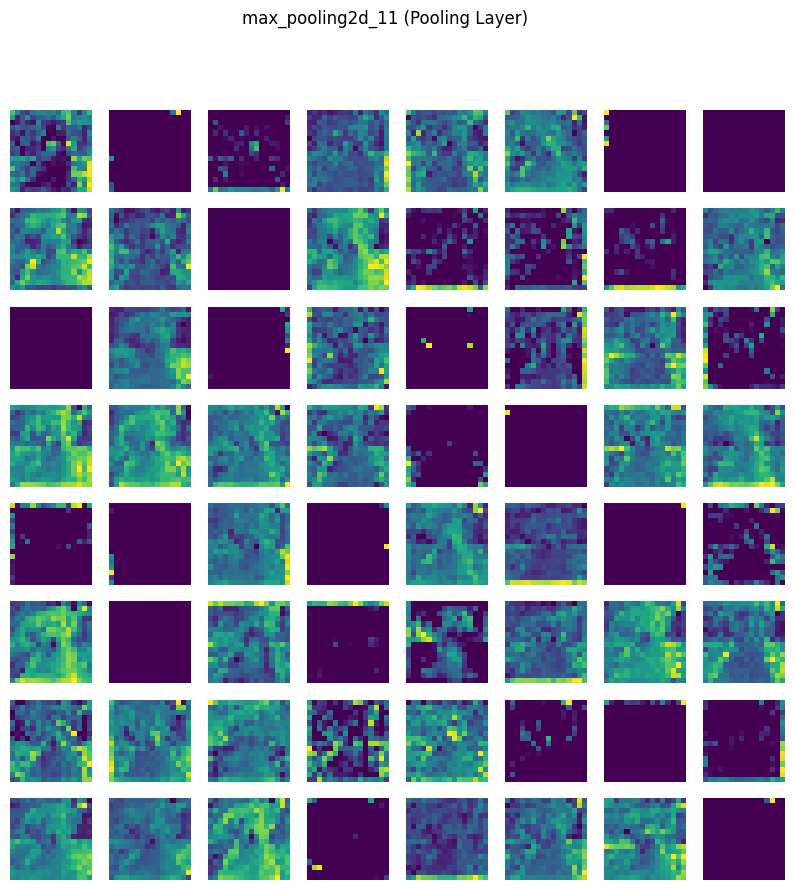


conv2d_15 → Convolution Layer
Shape: (1, 16, 16, 128)


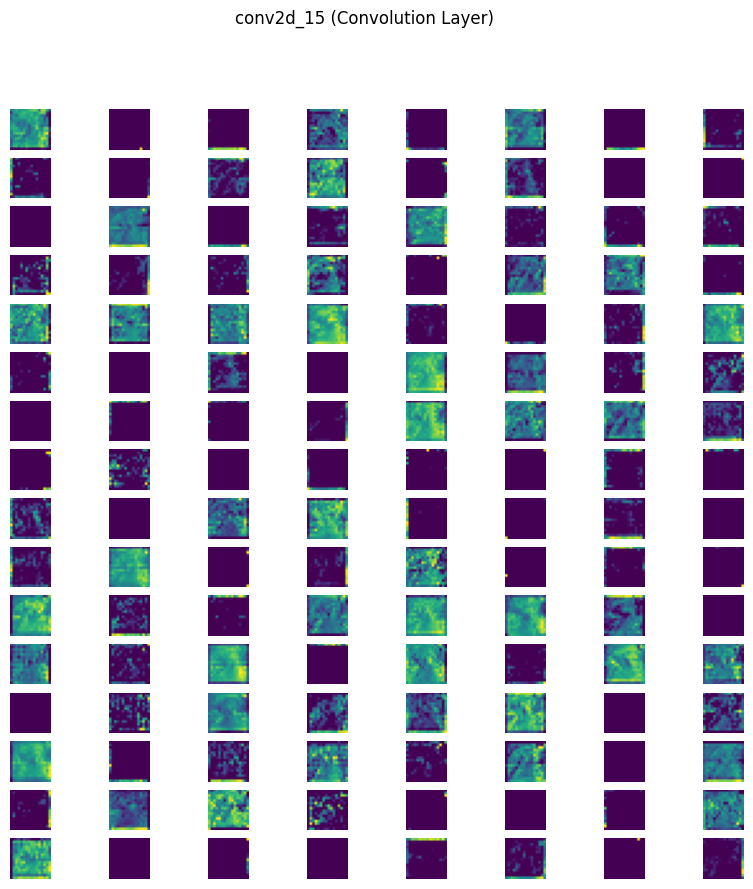


flatten_1 → Flatten Layer
Shape: (1, 32768)


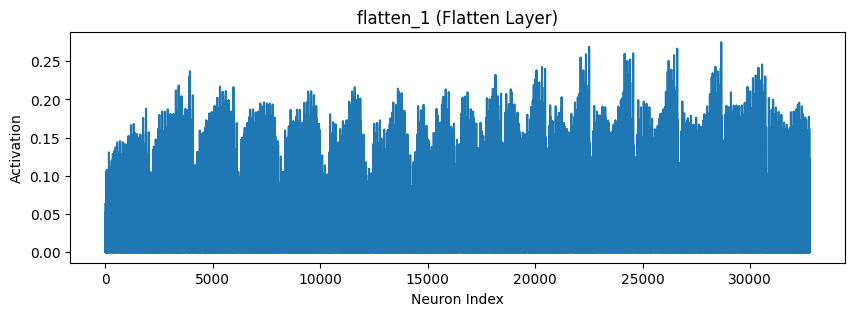


dense_2 → Fully Connected Layer
Shape: (1, 128)


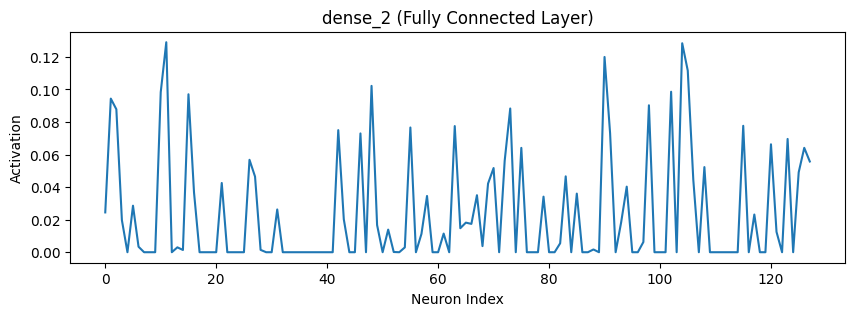


dense_3 → Fully Connected Layer
Shape: (1, 10)


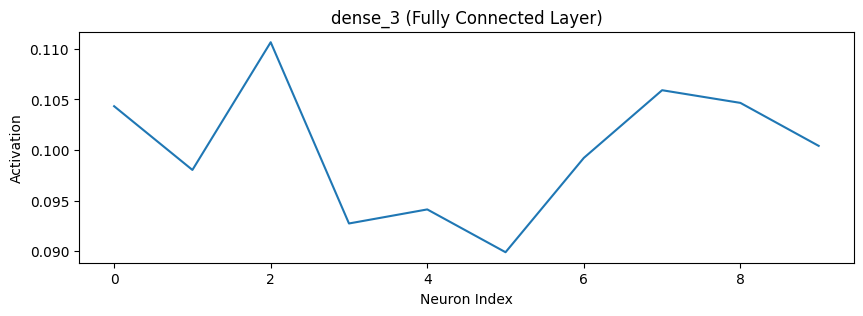

In [ ]:
# Visualizing Convolution Neural Network using simple convolution, pooling, and Dense layers (Fully Connected Layers)
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Input, Flatten, Dense

# -----------------------------
# 1. Load Image
# -----------------------------
img_path = "/content/dog-image.jfif"

img = image.load_img(img_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# -----------------------------
# 2. Build CNN (with Dense layers)
# -----------------------------
input_layer = Input(shape=(128, 128, 3))

x = Conv2D(16, (3,3), activation='relu', padding='same')(input_layer)
x = MaxPooling2D((2,2))(x)

x = Conv2D(32, (3,3), activation='relu', padding='same')(x)
x = MaxPooling2D((2,2))(x)

x = Conv2D(64, (3,3), activation='relu', padding='same')(x)
x = MaxPooling2D((2,2))(x)

x = Conv2D(128, (3,3), activation='relu', padding='same')(x)

# 🔥 Fully Connected Part
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
output = Dense(10, activation='softmax')(x)  # assume 10 classes

model = Model(inputs=input_layer, outputs=output)

# 3. Select ALL layers

layer_outputs = [layer.output for layer in model.layers]
layer_names = [layer.name for layer in model.layers]

activation_model = Model(inputs=model.input, outputs=layer_outputs)


activations = activation_model.predict(img_array)

def get_layer_type(layer):
    if isinstance(layer, Conv2D):
        return "Convolution Layer"
    elif isinstance(layer, MaxPooling2D):
        return "Pooling Layer"
    elif isinstance(layer, Flatten):
        return "Flatten Layer"
    elif isinstance(layer, Dense):
        return "Fully Connected Layer"
    else:
        return "Other Layer"

# -----------------------------
# 6. Visualization
# -----------------------------
def visualize_all_layers(activations, layer_names, model):
    for act, name in zip(activations, layer_names):

        layer = model.get_layer(name)
        layer_type = get_layer_type(layer)

        print("\n" + "="*50)
        print(f"{name} → {layer_type}")
        print(f"Shape: {act.shape}")
        print("="*50)

        # 🔹 Case 1: Feature maps (Conv/Pool)
        if len(act.shape) == 4:
            num_filters = act.shape[-1]

            cols = 8
            rows = max(1, num_filters // cols)

            plt.figure(figsize=(10, 10))
            plt.suptitle(f"{name} ({layer_type})")

            for i in range(min(num_filters, cols * rows)):
                plt.subplot(rows, cols, i+1)
                plt.imshow(act[0, :, :, i], cmap='viridis')
                plt.axis('off')

            plt.show()

        # 🔹 Case 2: Dense / Flatten output
        elif len(act.shape) == 2:
            plt.figure(figsize=(10, 3))
            plt.title(f"{name} ({layer_type})")

            plt.plot(act[0])
            plt.xlabel("Neuron Index")
            plt.ylabel("Activation")

            plt.show()

# -----------------------------
# 7. Run
# -----------------------------
visualize_all_layers(activations, layer_names, model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 584ms/step

Layer Name  : block1_conv1
Layer Type  : Convolution Layer
Output Shape: (1, 224, 224, 64)


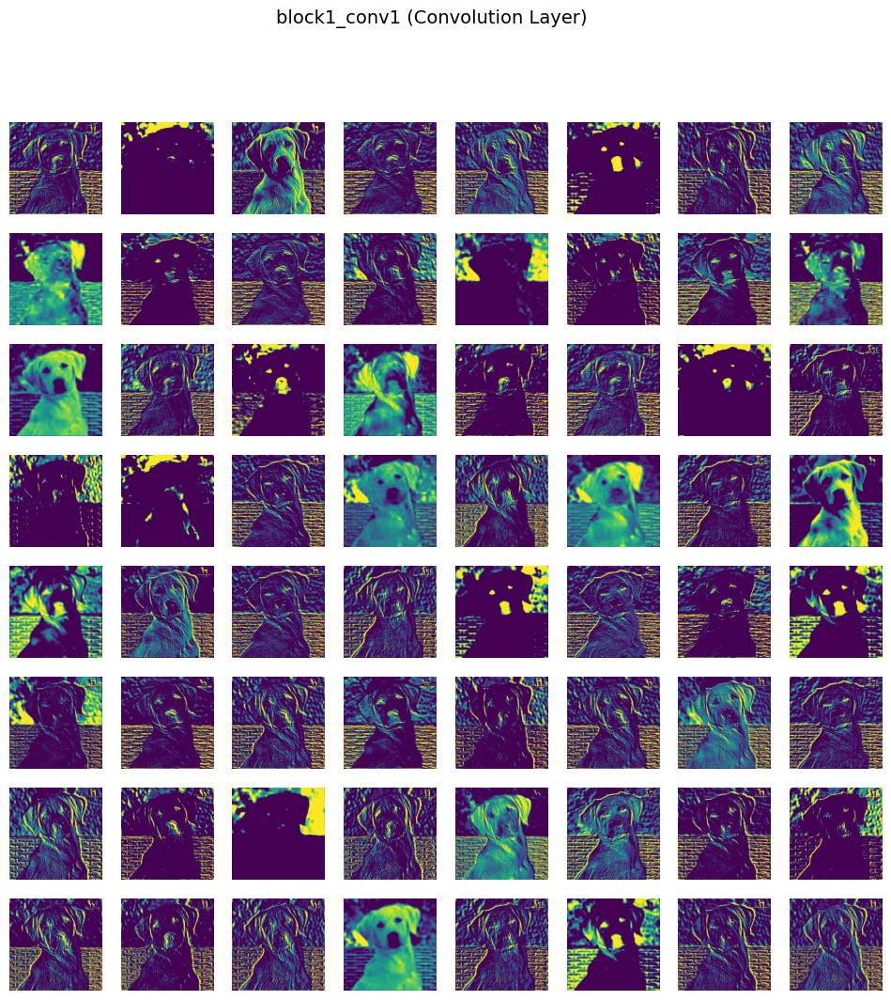


Layer Name  : block1_pool
Layer Type  : Pooling Layer
Output Shape: (1, 112, 112, 64)


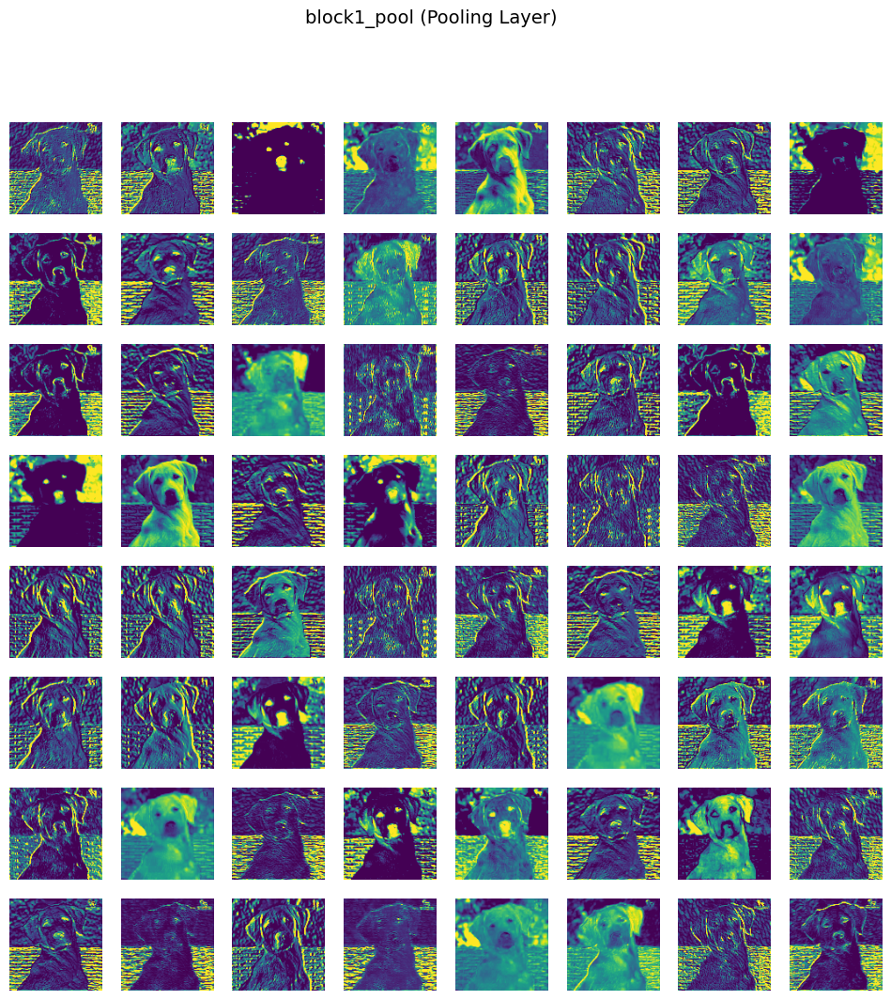


Layer Name  : block2_conv1
Layer Type  : Convolution Layer
Output Shape: (1, 112, 112, 128)


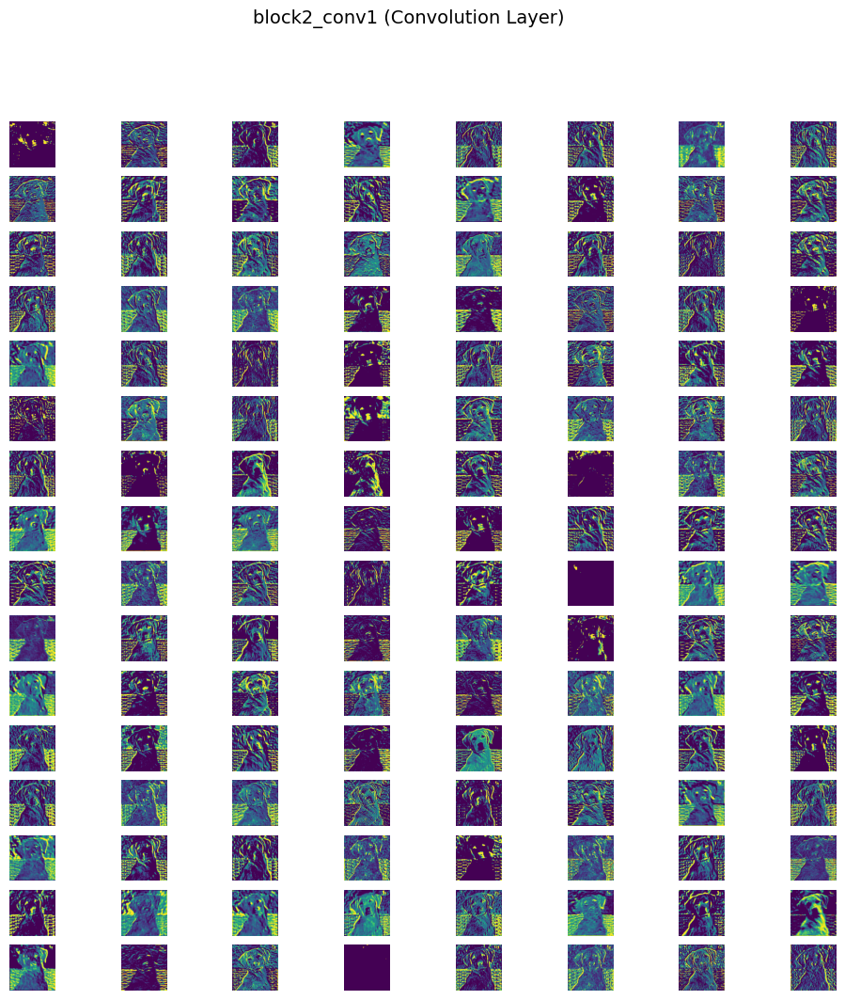


Layer Name  : block2_pool
Layer Type  : Pooling Layer
Output Shape: (1, 56, 56, 128)


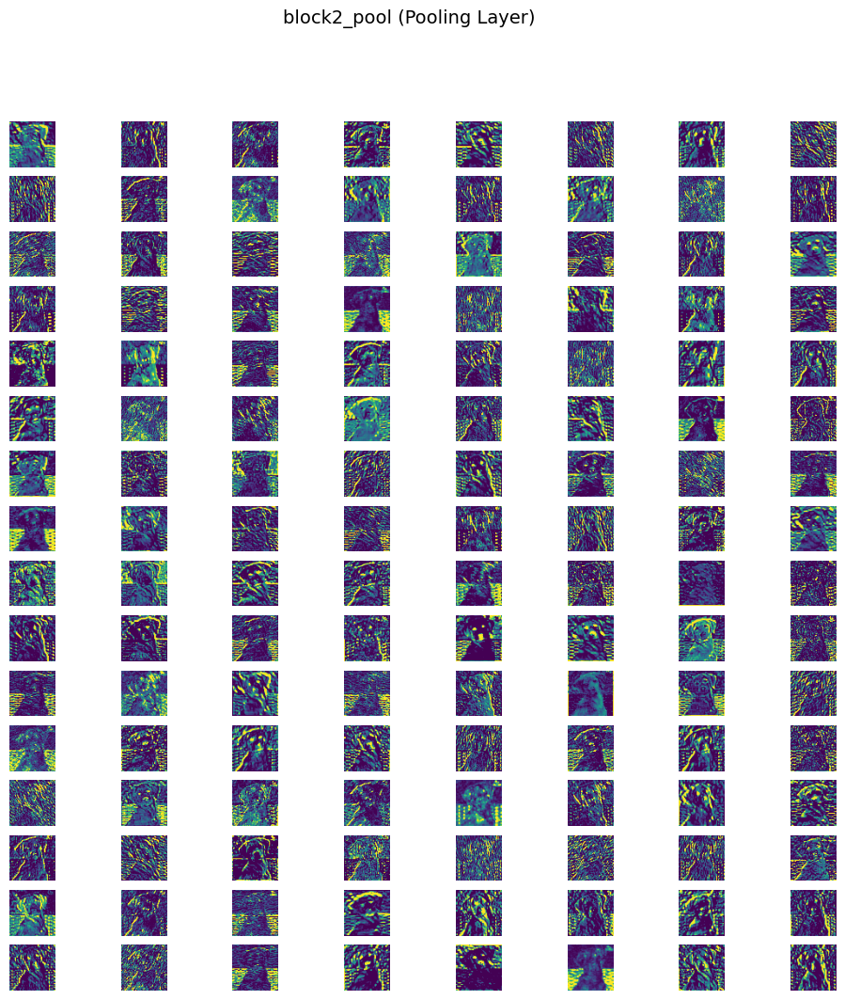


Layer Name  : block3_conv1
Layer Type  : Convolution Layer
Output Shape: (1, 56, 56, 256)


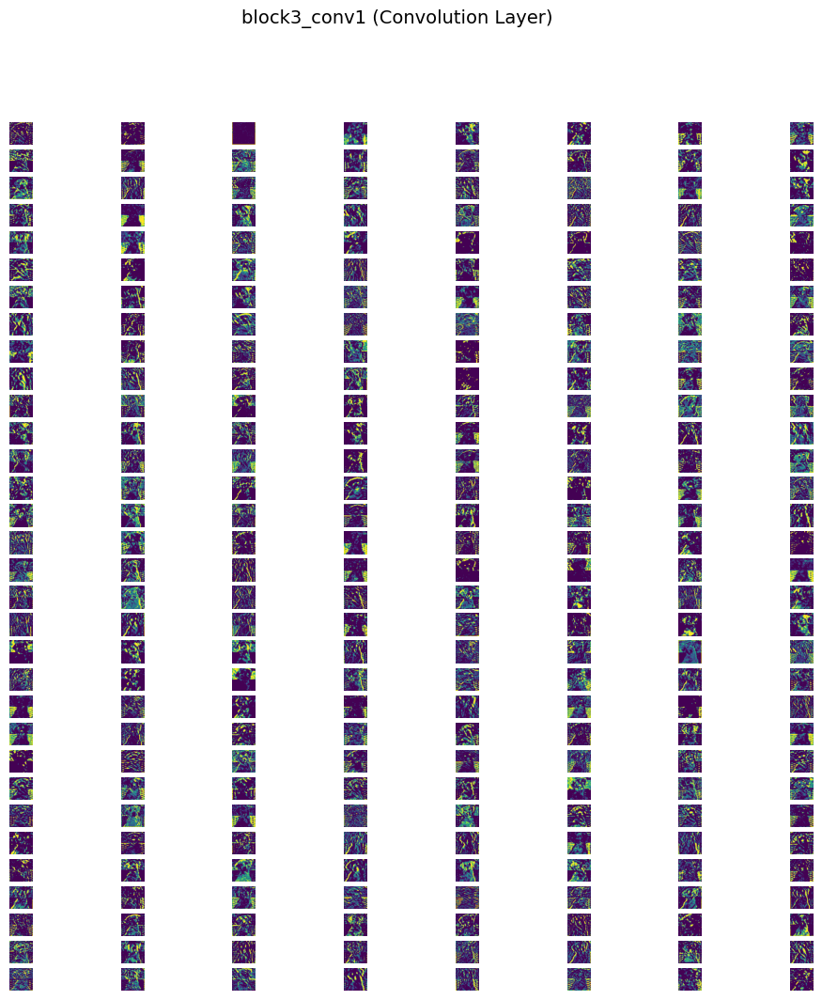


Layer Name  : block3_pool
Layer Type  : Pooling Layer
Output Shape: (1, 28, 28, 256)


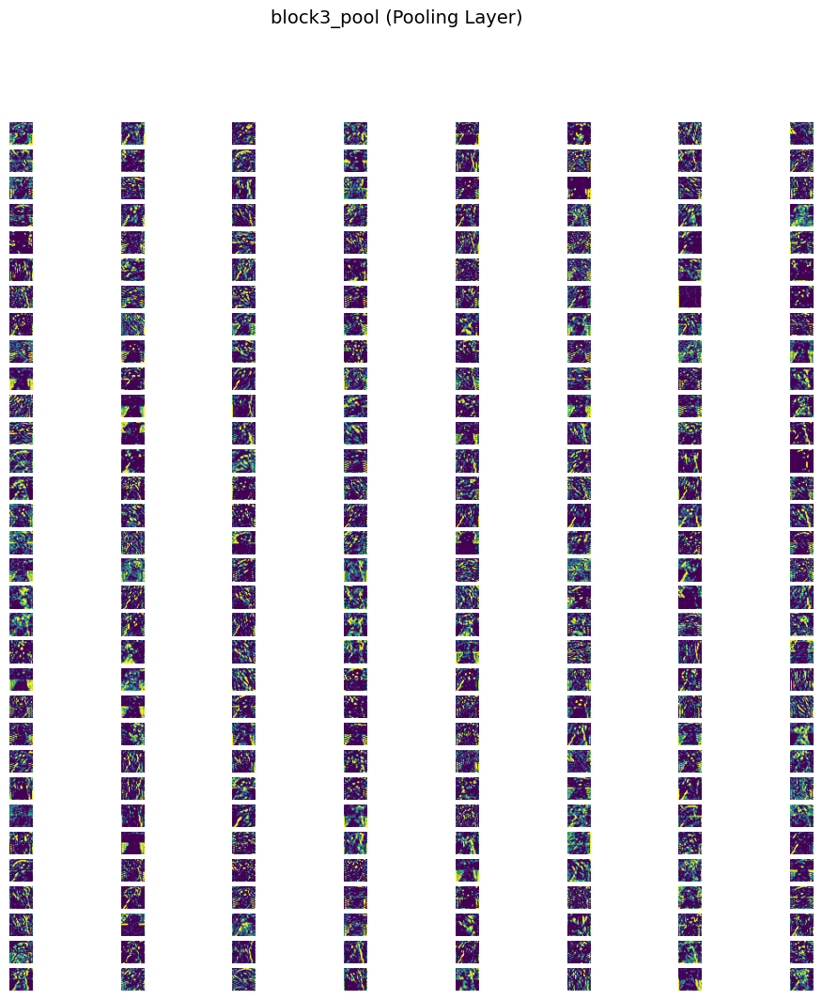


Layer Name  : block4_conv1
Layer Type  : Convolution Layer
Output Shape: (1, 28, 28, 512)


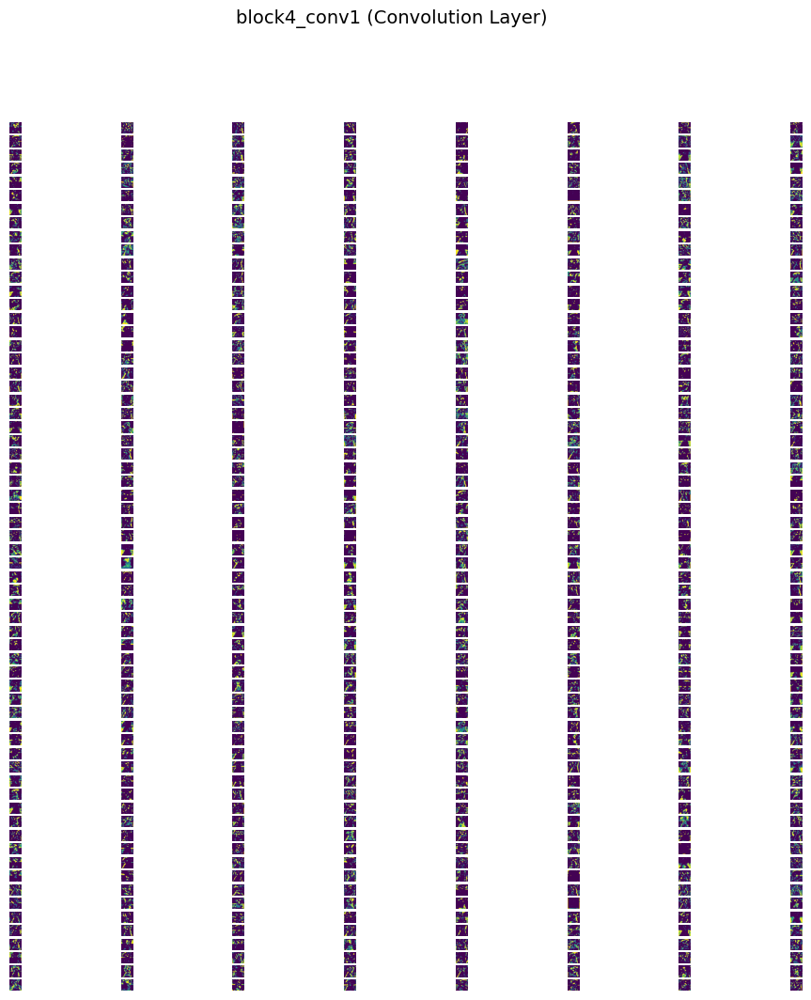


Layer Name  : block4_pool
Layer Type  : Pooling Layer
Output Shape: (1, 14, 14, 512)


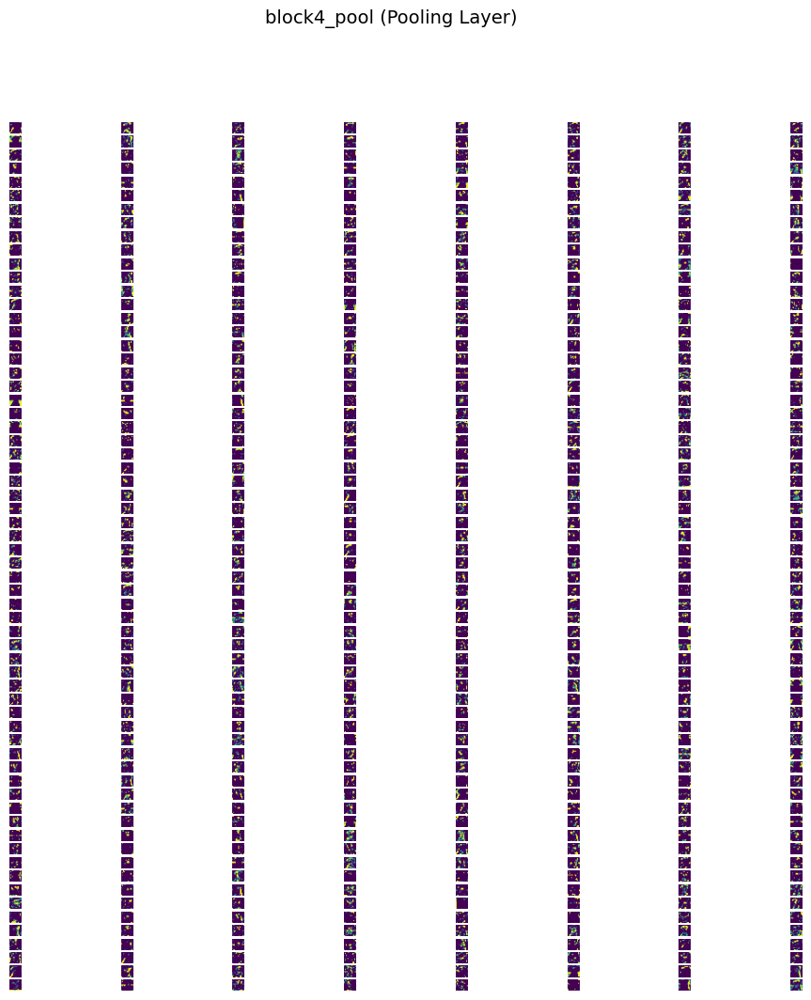


Layer Name  : block5_conv1
Layer Type  : Convolution Layer
Output Shape: (1, 14, 14, 512)


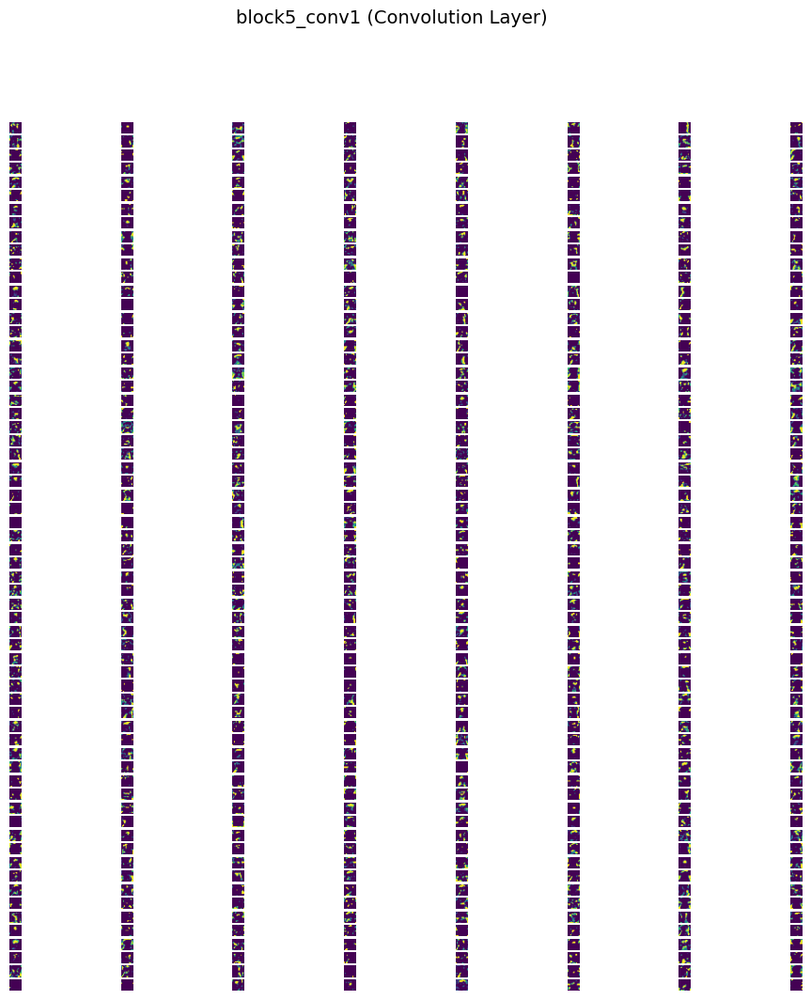

In [ ]:
# Visualizing Convolution Neural Network using pre-trained model like VGG16
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.models import Model

# ✅ Import layer classes (IMPORTANT)
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten

# -----------------------------
# 1. Load Image
# -----------------------------
img_path = "/content/dog-image.jfif"

img = image.load_img(img_path, target_size=(224, 224))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)

# -----------------------------
# 2. Load Pretrained VGG16
# -----------------------------
base_model = VGG16(weights='imagenet', include_top=False)

# -----------------------------
# 3. Select Layers (Conv + Pool)
# -----------------------------
layer_names = [
    'block1_conv1', 'block1_pool',
    'block2_conv1', 'block2_pool',
    'block3_conv1', 'block3_pool',
    'block4_conv1', 'block4_pool',
    'block5_conv1'
]

outputs = [base_model.get_layer(name).output for name in layer_names]

model = Model(inputs=base_model.input, outputs=outputs)

# -----------------------------
# 4. Predict Feature Maps
# -----------------------------
feature_maps = model.predict(img_array)

# -----------------------------
# 5. Function to Identify Layer Type
# -----------------------------
def get_layer_type(layer):
    if isinstance(layer, Conv2D):
        return "Convolution Layer"
    elif isinstance(layer, MaxPooling2D):
        return "Pooling Layer"
    elif isinstance(layer, Dense):
        return "Fully Connected Layer"
    elif isinstance(layer, Flatten):
        return "Flatten Layer"
    else:
        return "Other Layer"

# -----------------------------
# 6. Visualization Function
# -----------------------------
def plot_feature_maps(feature_maps, layer_names, model):
    for fmap, name in zip(feature_maps, layer_names):

        layer = model.get_layer(name)
        layer_type = get_layer_type(layer)

        print("\n" + "="*50)
        print(f"Layer Name  : {name}")
        print(f"Layer Type  : {layer_type}")
        print(f"Output Shape: {fmap.shape}")
        print("="*50)

        num_filters = fmap.shape[-1]
        cols = 8
        rows = num_filters // cols

        plt.figure(figsize=(12, 12))
        plt.suptitle(f"{name} ({layer_type})", fontsize=14)

        for i in range(min(num_filters, cols * rows)):
            plt.subplot(rows, cols, i + 1)

            img = fmap[0, :, :, i]

            # ✅ Normalize for better visualization
            img -= img.mean()
            img /= (img.std() + 1e-5)
            img *= 64
            img += 128
            img = np.clip(img, 0, 255).astype('uint8')

            plt.imshow(img, cmap='viridis')
            plt.axis('off')

        plt.show()

# -----------------------------
# 7. Run Visualization
# -----------------------------
plot_feature_maps(feature_maps, layer_names, base_model)

**What feature maps actually represent**
Each feature map = response of a filter (kernel)

Think of filters as:

“edge detector”
“curve detector”
“texture detector”
“dog ear detector” (in deeper layers)

**How recognition happens step-by-step**

Step 1: Early layers
Detect edges, colors
Example: outlines of dog

Step 2: Middle layers
Combine edges → textures
Example: fur patterns

Step 3: Deep layers
Combine textures → parts
Example: ears, nose

Step 4: Final feature maps
Contain high-level representation
Not image — but important signals

**Key Idea:**

*Pixels → Edges → Textures → Parts → Object*

**Convolution** -> creates feature maps

**Pooling** -> reduce the size of feature map

**Flatten** -> converts 3D image into 1D vector

**Dense** -> Graph of Neural Network


# Week-10
20.Implement Guided Backpropagation to discover which input pixels influence the perceptron.(Give all the intermediate steps and write your observations)

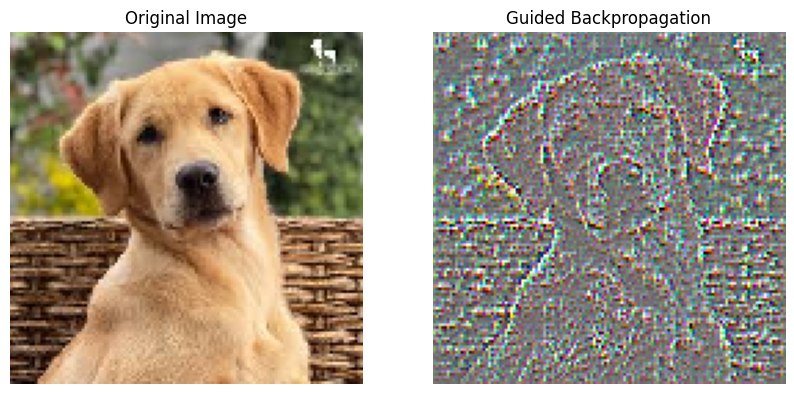

In [ ]:
#Implementing Guided Backpropogation to find the pixels that activates the neuron

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Input, Flatten, Dense
from tensorflow.keras.models import Model

# -----------------------------
# 1. Load Image
# -----------------------------
img_path = "/content/dog-image.jfif"

img = image.load_img(img_path, target_size=(128, 128))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0) / 255.0

# -----------------------------
# 2. Build CNN
# -----------------------------
inputs = Input(shape=(128,128,3))

x = Conv2D(16, (3,3), activation='relu', padding='same')(inputs)
x = MaxPooling2D((2,2))(x)

x = Conv2D(32, (3,3), activation='relu', padding='same')(x)
x = MaxPooling2D((2,2))(x)

x = Conv2D(64, (3,3), activation='relu', padding='same')(x)
x = MaxPooling2D((2,2))(x)

x = Conv2D(128, (3,3), activation='relu', padding='same')(x)

x = Flatten()(x)
x = Dense(128, activation='relu')(x)
outputs = Dense(10, activation='softmax')(x)

model = Model(inputs, outputs)

# -----------------------------
# 3. Choose target class
# -----------------------------
preds = model(img_array)
class_idx = tf.argmax(preds[0])

# -----------------------------
# 4. Guided Backpropagation
# -----------------------------
@tf.custom_gradient
def guided_relu(x):
    def grad(dy):
        return tf.cast(dy > 0, "float32") * tf.cast(x > 0, "float32") * dy
    return tf.nn.relu(x), grad

# Replace ReLU with guided ReLU
for layer in model.layers:
    if hasattr(layer, 'activation') and layer.activation == tf.keras.activations.relu:
        layer.activation = guided_relu

# -----------------------------
# 5. Compute Gradients
# -----------------------------
with tf.GradientTape() as tape:
    inputs = tf.cast(img_array, tf.float32)
    tape.watch(inputs)
    preds = model(inputs)
    loss = preds[:, class_idx]

grads = tape.gradient(loss, inputs)[0]

# -----------------------------
# 6. Normalize gradients
# -----------------------------
grads = grads.numpy()

grads -= grads.mean()
grads /= (grads.std() + 1e-5)
grads *= 0.25

grads += 0.5
grads = np.clip(grads, 0, 1)

# -----------------------------
# 7. Display
# -----------------------------
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(img)
plt.axis('off')

plt.subplot(1,2,2)
plt.title("Guided Backpropagation")
plt.imshow(grads)
plt.axis('off')

plt.show()

**Step 1: Input Image**
- Load dog image
- Convert to array

**Step 2: CNN Model**

 Conv → Pool → Conv → Pool → Dense
Produces prediction

**Step 3: Guided ReLU**

- Normal ReLU:
negative values → removed

-  Guided ReLU:

 Allow gradient only if:
 activation > 0, gradient > 0

- Removes unwanted signals

**Step 4: Gradient Computation**
`tape.gradient(loss, inputs)`

- It computes How much each pixel affects the output.

**Step 5: Visualization**
Normalize values
Display important pixels


** INTERMEDIATE STEPS **
1. Forward Pass
Image → CNN → Output probabilities
2. Select Target Class
Choose class with highest probability
3. Modify ReLU
Only allow positive activations and gradients
4. Backward Pass
Compute gradients of output w.r.t input pixels
5. Generate Saliency Map
Highlight important pixels

**Observations:**
1. Important regions are highlighted like
Dog edges, face, contours
2. Background is suppressed -
Less important pixels fade out
3. Edges are dominant -
Model focuses on boundaries
4. Noise is reduced
compared to normal gradients
5. High-resolution visualization -
Shows pixel-level importance